In [1]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import os
%matplotlib inline


In [123]:
#https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/

GOOD_MATCH_PERCENT = 0.2
MAX_FEATURES = 500


def alignImages(im1, im2):
    im1=cv.normalize(im1, None, 0, 255, cv.NORM_MINMAX)
    im2=cv.normalize(im2, None, 0, 255, cv.NORM_MINMAX)
    
    im1=np.uint8(im1)
    im2=np.uint8(im2)
    orb = cv.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2, None)

    # Match features.
    matcher = cv.DescriptorMatcher_create(cv.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    # Find homography
    h, mask = cv.findHomography(points1, points2, cv.RANSAC)

    # Use homography
    height, width = im1.shape
    print(type(im1[0][0]))
    im1Reg = cv.warpPerspective(im1, h, (width, height))

    return im1Reg, np.linalg.inv(h)

<class 'numpy.uint8'>


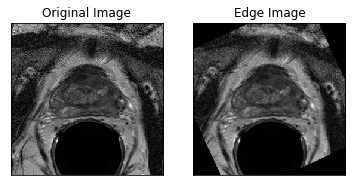

<class 'numpy.uint8'>


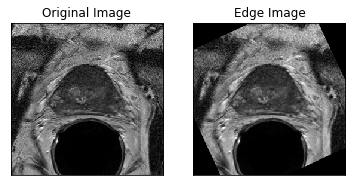

<class 'numpy.uint8'>


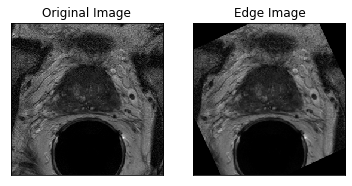

<class 'numpy.uint8'>


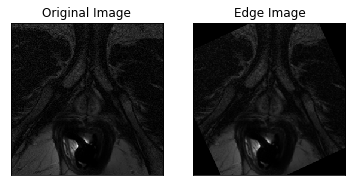

<class 'numpy.uint8'>


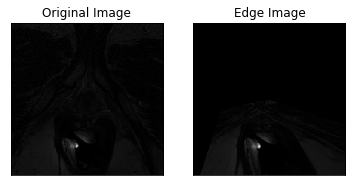

<class 'numpy.uint8'>


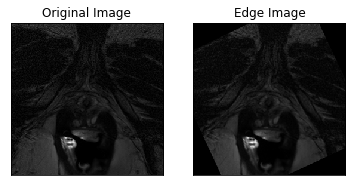

<class 'numpy.uint8'>


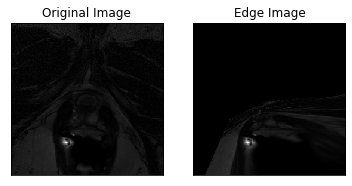

<class 'numpy.uint8'>


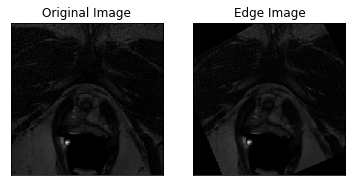

<class 'numpy.uint8'>


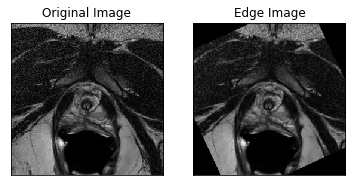

<class 'numpy.uint8'>


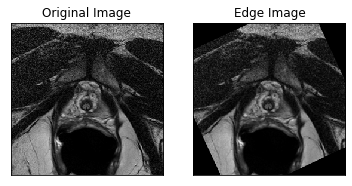

<class 'numpy.uint8'>


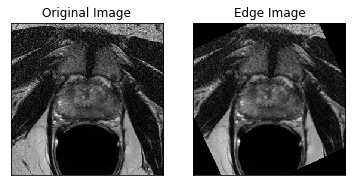

<class 'numpy.uint8'>


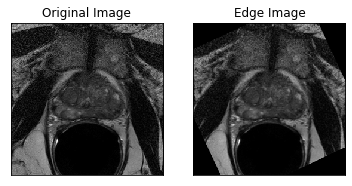

<class 'numpy.uint8'>


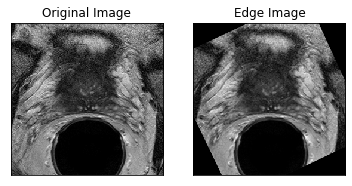

<class 'numpy.uint8'>


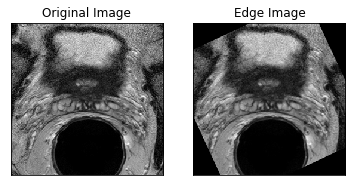

<class 'numpy.uint8'>


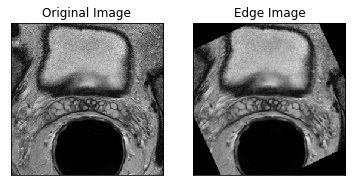

<class 'numpy.uint8'>


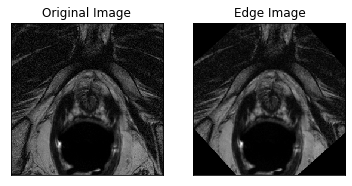

<class 'numpy.uint8'>


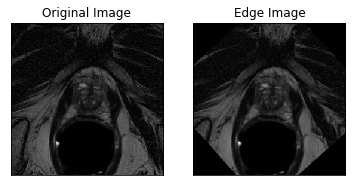

<class 'numpy.uint8'>


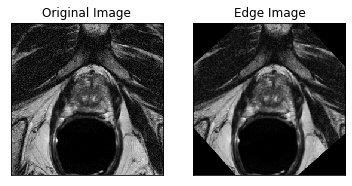

<class 'numpy.uint8'>


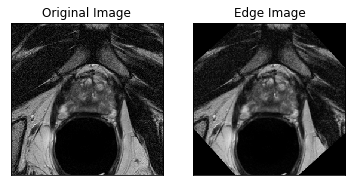

<class 'numpy.uint8'>


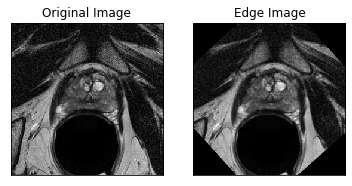

<class 'numpy.uint8'>


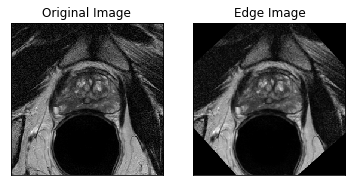

<class 'numpy.uint8'>


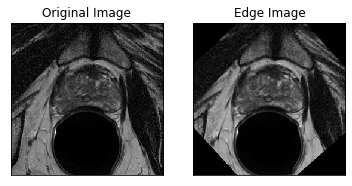

<class 'numpy.uint8'>


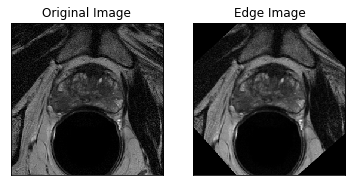

<class 'numpy.uint8'>


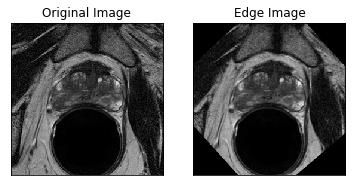

<class 'numpy.uint8'>


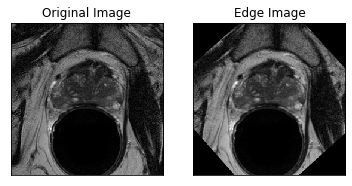

<class 'numpy.uint8'>


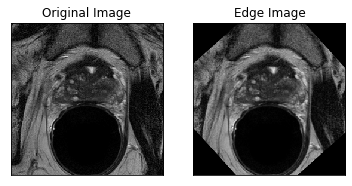

<class 'numpy.uint8'>


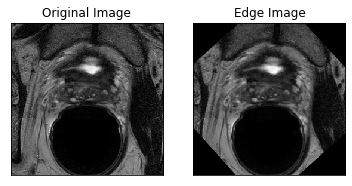

<class 'numpy.uint8'>


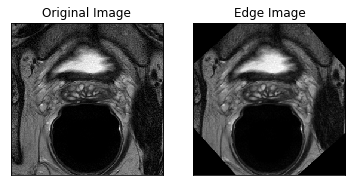

<class 'numpy.uint8'>


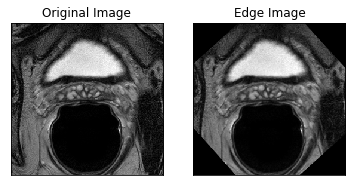

<class 'numpy.uint8'>


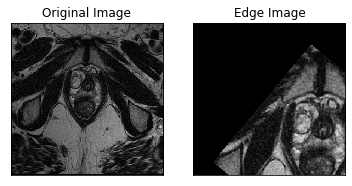

<class 'numpy.uint8'>


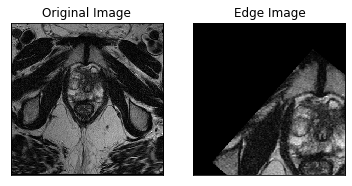

<class 'numpy.uint8'>


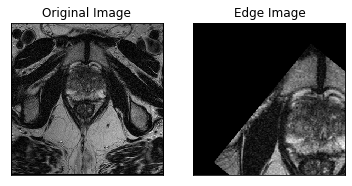

<class 'numpy.uint8'>


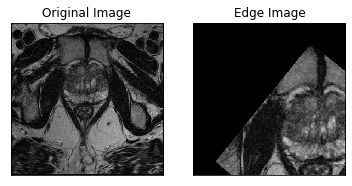

<class 'numpy.uint8'>


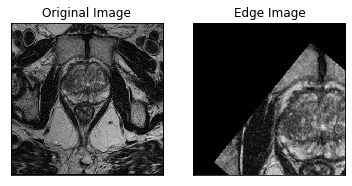

<class 'numpy.uint8'>


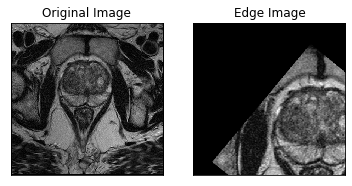

<class 'numpy.uint8'>


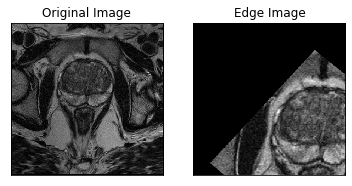

<class 'numpy.uint8'>


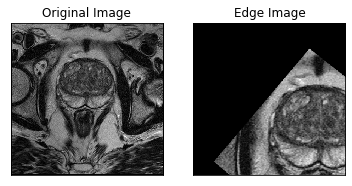

<class 'numpy.uint8'>


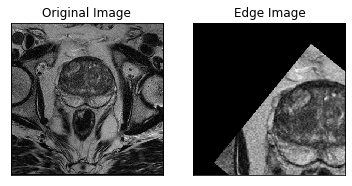

<class 'numpy.uint8'>


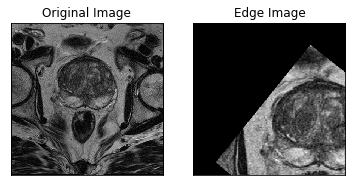

<class 'numpy.uint8'>


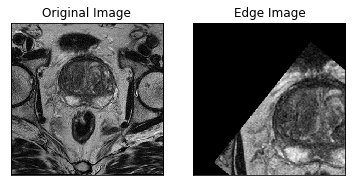

<class 'numpy.uint8'>


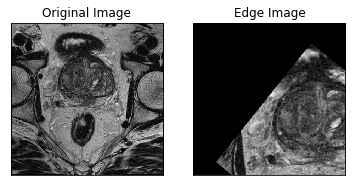

<class 'numpy.uint8'>


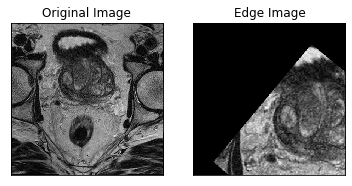

<class 'numpy.uint8'>


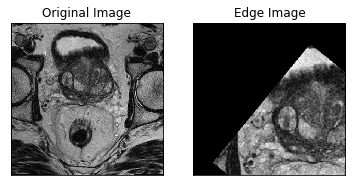

<class 'numpy.uint8'>


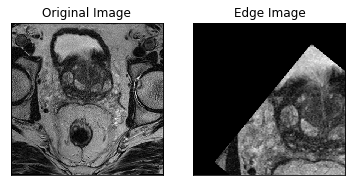

<class 'numpy.uint8'>


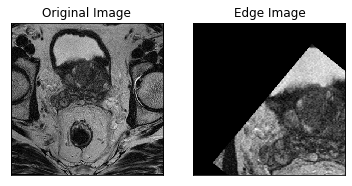

<class 'numpy.uint8'>


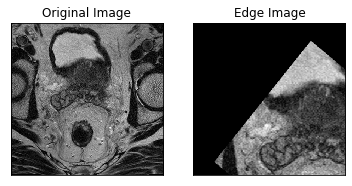

<class 'numpy.uint8'>


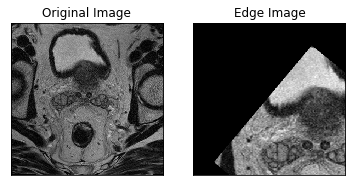

<class 'numpy.uint8'>


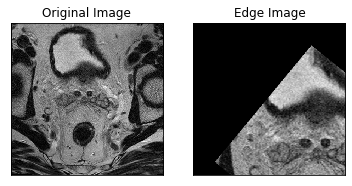

<class 'numpy.uint8'>


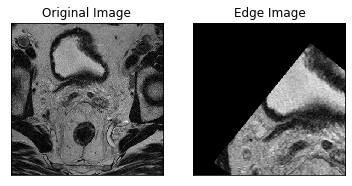

<class 'numpy.uint8'>


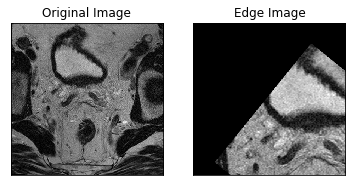

<class 'numpy.uint8'>


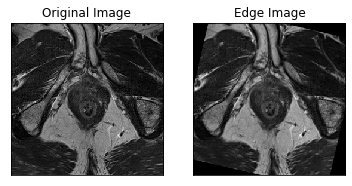

<class 'numpy.uint8'>


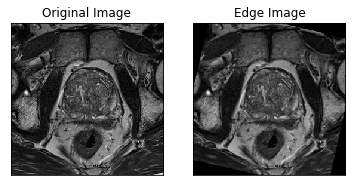

<class 'numpy.uint8'>


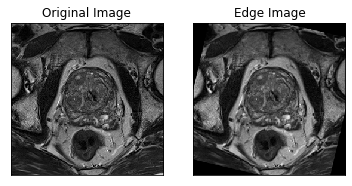

<class 'numpy.uint8'>


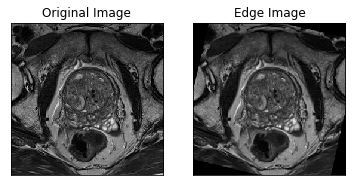

<class 'numpy.uint8'>


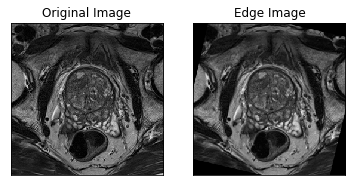

<class 'numpy.uint8'>


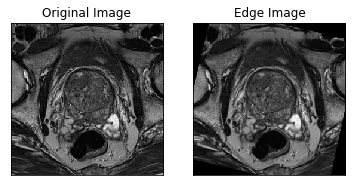

<class 'numpy.uint8'>


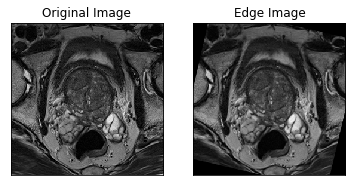

<class 'numpy.uint8'>


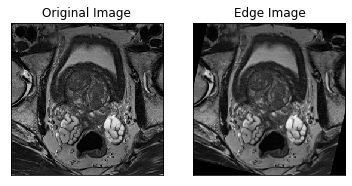

<class 'numpy.uint8'>


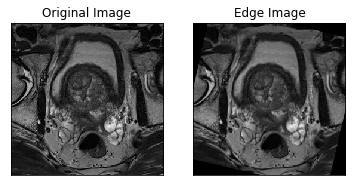

<class 'numpy.uint8'>


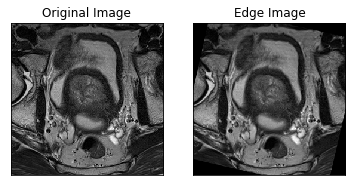

<class 'numpy.uint8'>


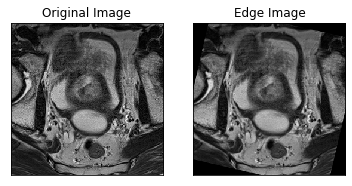

<class 'numpy.uint8'>


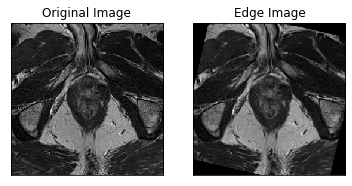

<class 'numpy.uint8'>


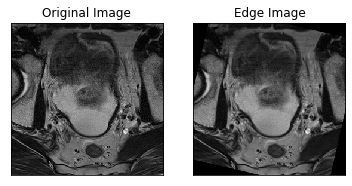

<class 'numpy.uint8'>


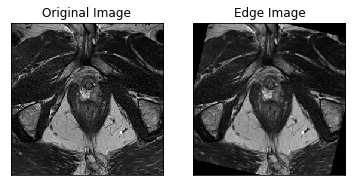

<class 'numpy.uint8'>


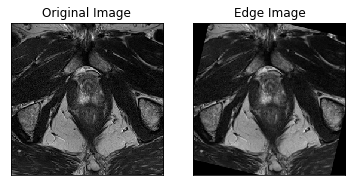

<class 'numpy.uint8'>


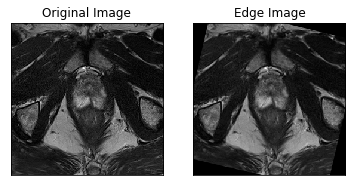

<class 'numpy.uint8'>


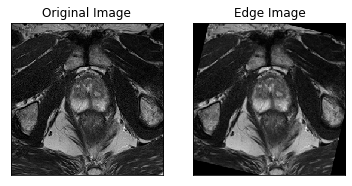

<class 'numpy.uint8'>


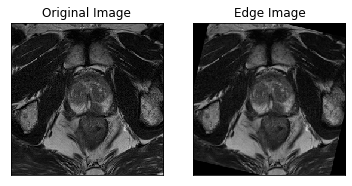

<class 'numpy.uint8'>


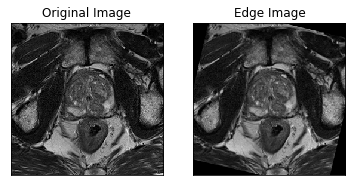

<class 'numpy.uint8'>


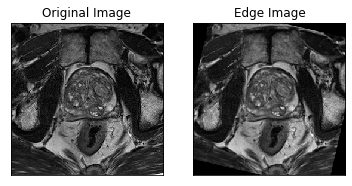

<class 'numpy.uint8'>


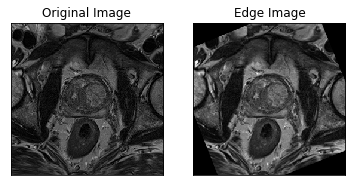

<class 'numpy.uint8'>


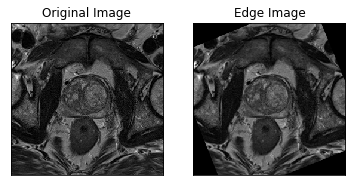

<class 'numpy.uint8'>


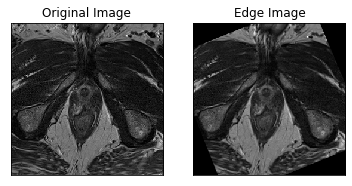

<class 'numpy.uint8'>


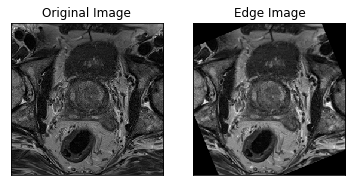

<class 'numpy.uint8'>


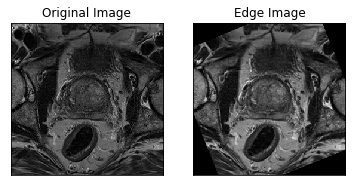

<class 'numpy.uint8'>


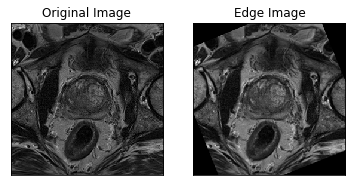

<class 'numpy.uint8'>


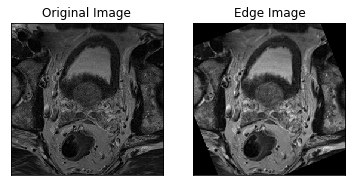

<class 'numpy.uint8'>


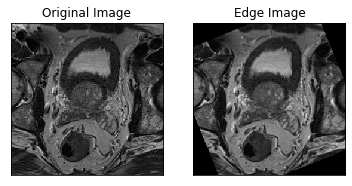

<class 'numpy.uint8'>


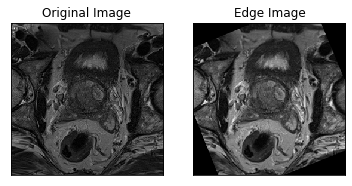

<class 'numpy.uint8'>


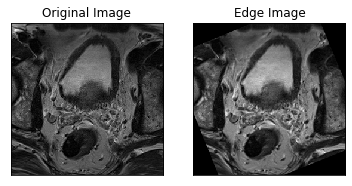

<class 'numpy.uint8'>


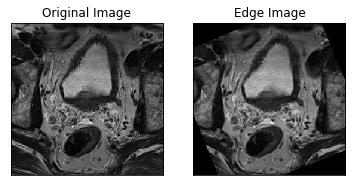

<class 'numpy.uint8'>


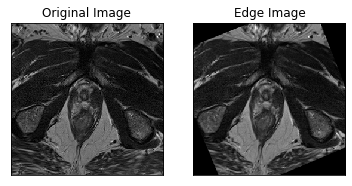

<class 'numpy.uint8'>


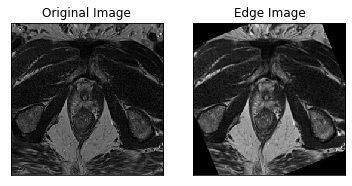

<class 'numpy.uint8'>


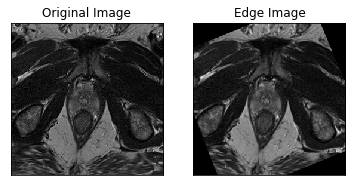

<class 'numpy.uint8'>


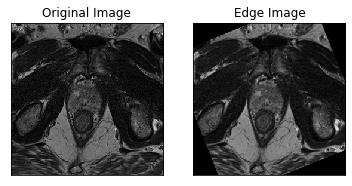

<class 'numpy.uint8'>


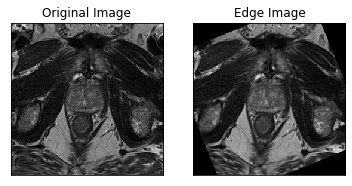

<class 'numpy.uint8'>


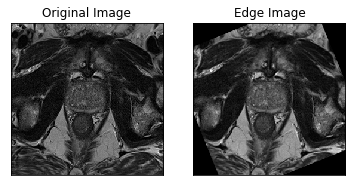

<class 'numpy.uint8'>


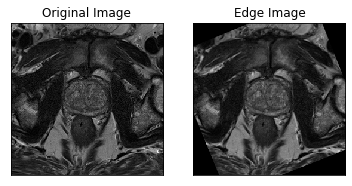

<class 'numpy.uint8'>


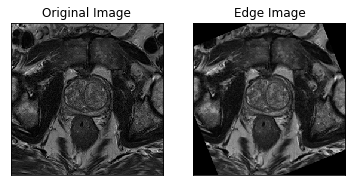

<class 'numpy.uint8'>


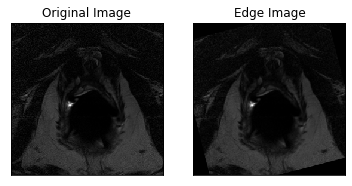

<class 'numpy.uint8'>


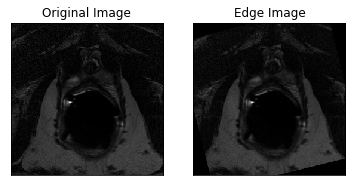

<class 'numpy.uint8'>


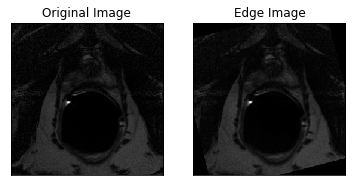

<class 'numpy.uint8'>


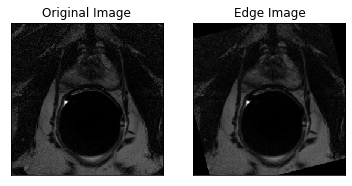

<class 'numpy.uint8'>


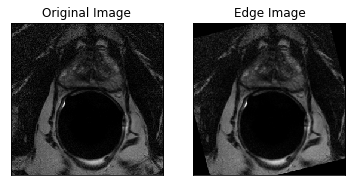

<class 'numpy.uint8'>


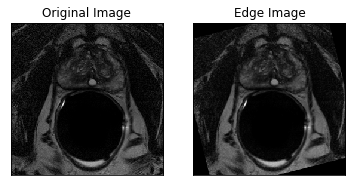

<class 'numpy.uint8'>


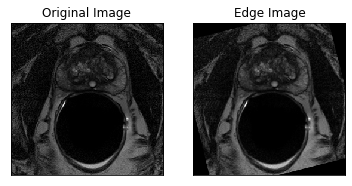

<class 'numpy.uint8'>


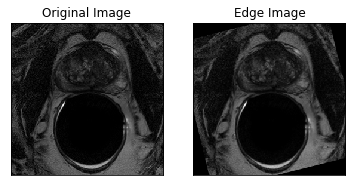

<class 'numpy.uint8'>


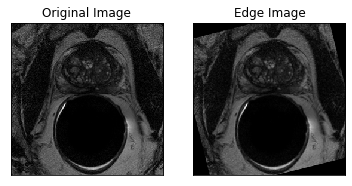

<class 'numpy.uint8'>


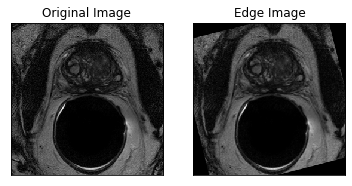

<class 'numpy.uint8'>


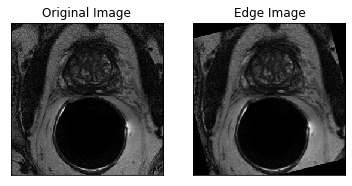

<class 'numpy.uint8'>


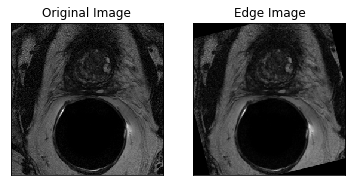

<class 'numpy.uint8'>


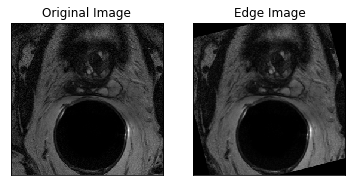

<class 'numpy.uint8'>


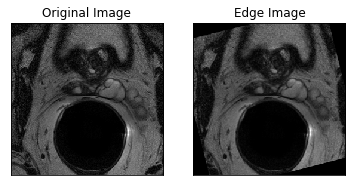

<class 'numpy.uint8'>


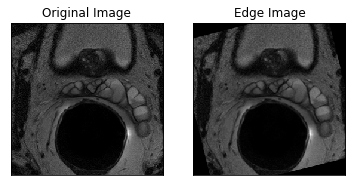

<class 'numpy.uint8'>


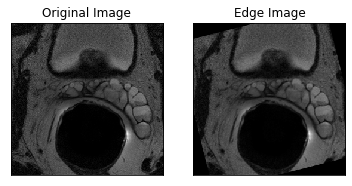

<class 'numpy.uint8'>


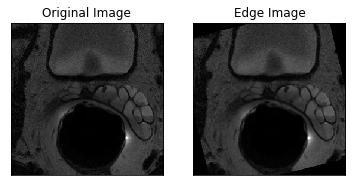

<class 'numpy.uint8'>


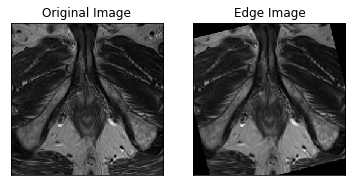

<class 'numpy.uint8'>


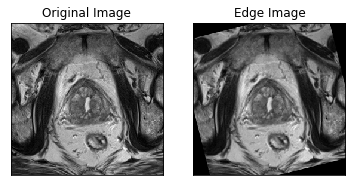

<class 'numpy.uint8'>


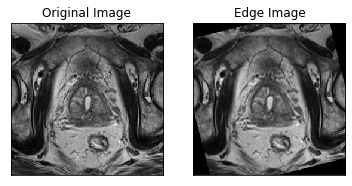

<class 'numpy.uint8'>


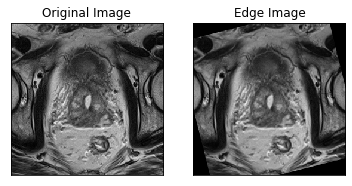

<class 'numpy.uint8'>


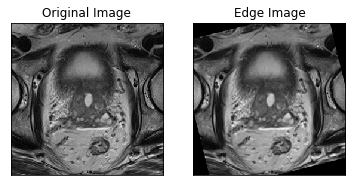

<class 'numpy.uint8'>


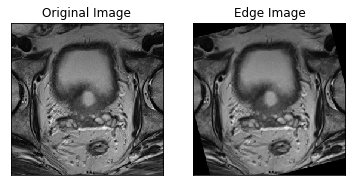

<class 'numpy.uint8'>


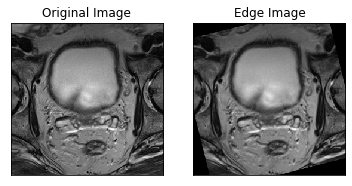

<class 'numpy.uint8'>


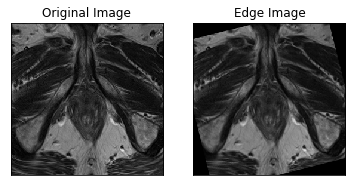

<class 'numpy.uint8'>


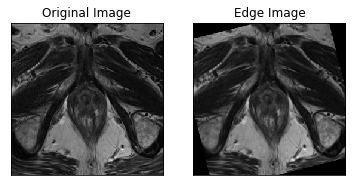

<class 'numpy.uint8'>


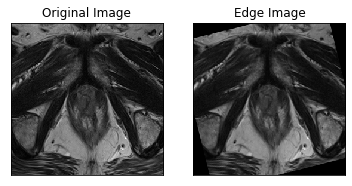

<class 'numpy.uint8'>


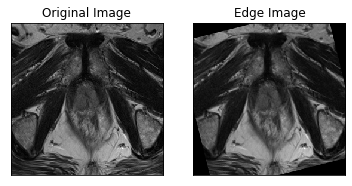

<class 'numpy.uint8'>


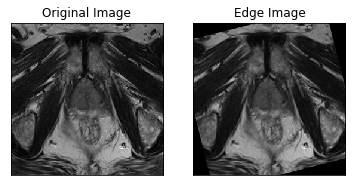

<class 'numpy.uint8'>


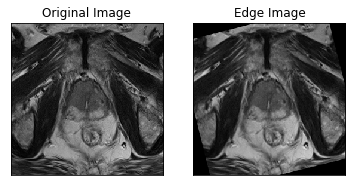

<class 'numpy.uint8'>


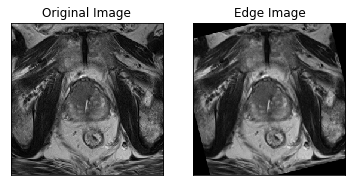

<class 'numpy.uint8'>


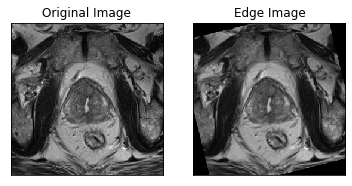

<class 'numpy.uint8'>


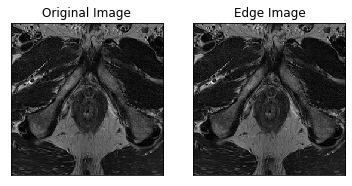

<class 'numpy.uint8'>


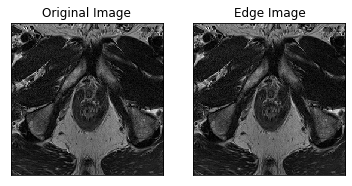

<class 'numpy.uint8'>


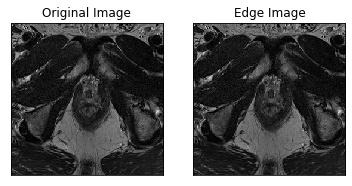

<class 'numpy.uint8'>


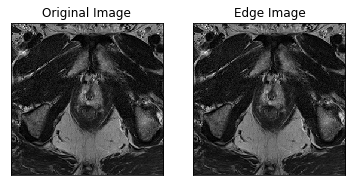

<class 'numpy.uint8'>


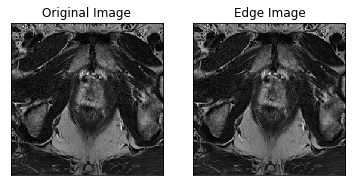

<class 'numpy.uint8'>


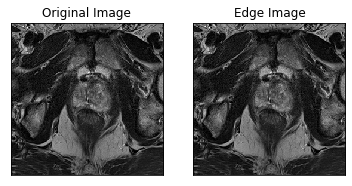

<class 'numpy.uint8'>


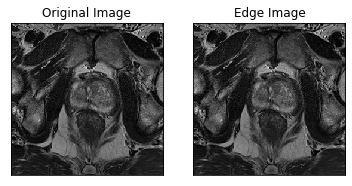

<class 'numpy.uint8'>


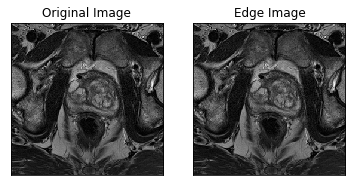

<class 'numpy.uint8'>


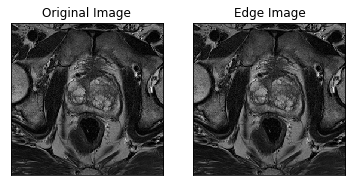

<class 'numpy.uint8'>


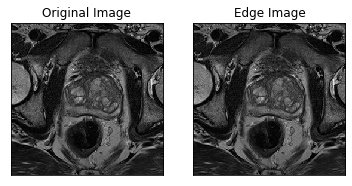

<class 'numpy.uint8'>


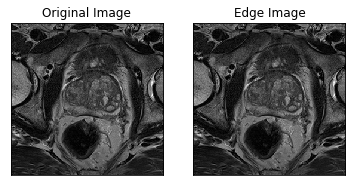

<class 'numpy.uint8'>


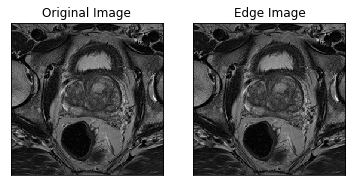

<class 'numpy.uint8'>


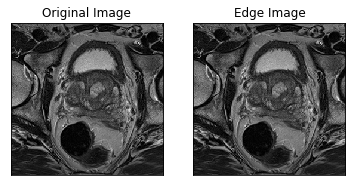

<class 'numpy.uint8'>


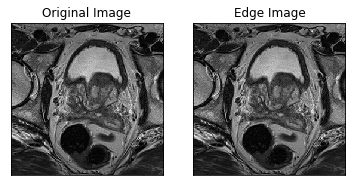

<class 'numpy.uint8'>


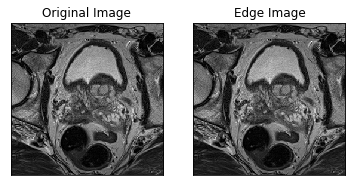

<class 'numpy.uint8'>


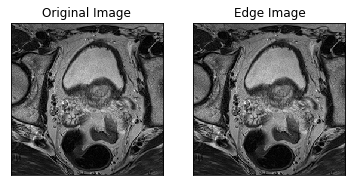

<class 'numpy.uint8'>


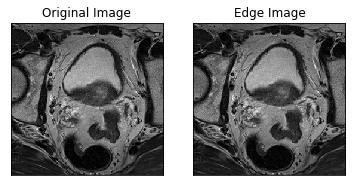

<class 'numpy.uint8'>


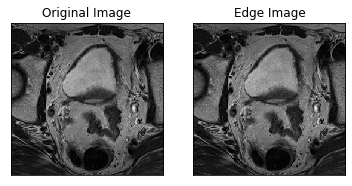

<class 'numpy.uint8'>


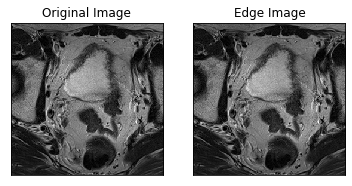

<class 'numpy.uint8'>


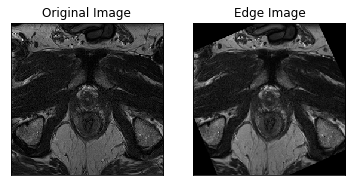

<class 'numpy.uint8'>


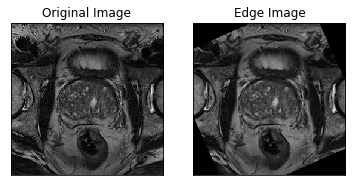

<class 'numpy.uint8'>


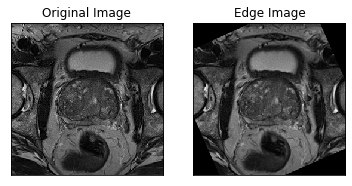

<class 'numpy.uint8'>


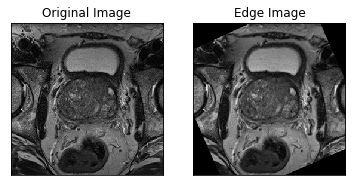

<class 'numpy.uint8'>


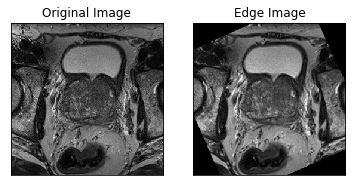

<class 'numpy.uint8'>


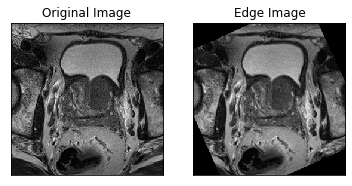

<class 'numpy.uint8'>


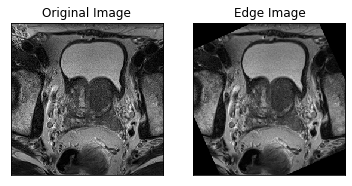

<class 'numpy.uint8'>


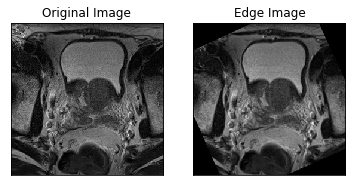

<class 'numpy.uint8'>


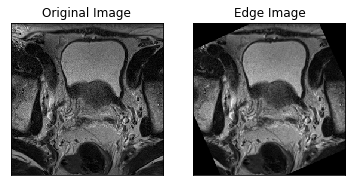

<class 'numpy.uint8'>


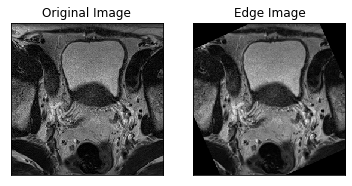

<class 'numpy.uint8'>


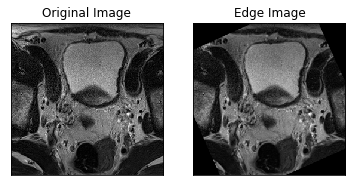

<class 'numpy.uint8'>


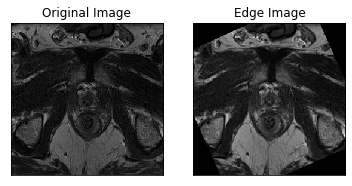

<class 'numpy.uint8'>


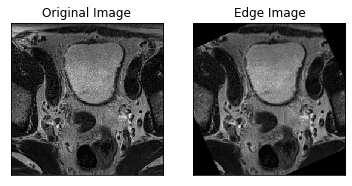

<class 'numpy.uint8'>


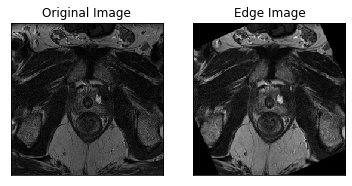

<class 'numpy.uint8'>


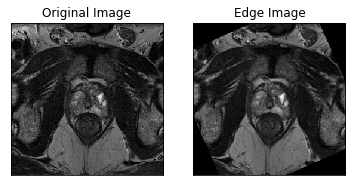

<class 'numpy.uint8'>


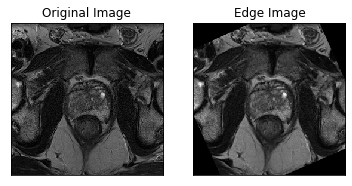

<class 'numpy.uint8'>


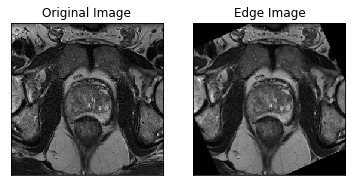

<class 'numpy.uint8'>


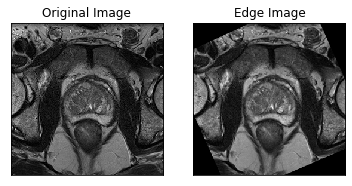

<class 'numpy.uint8'>


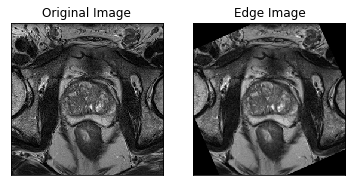

<class 'numpy.uint8'>


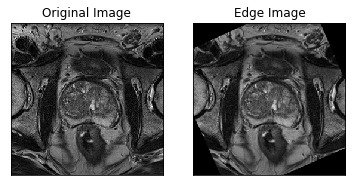

<class 'numpy.uint8'>


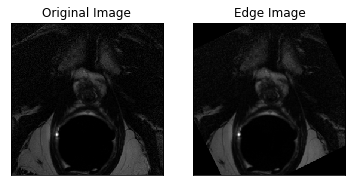

<class 'numpy.uint8'>


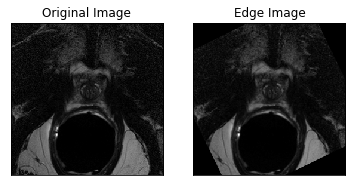

<class 'numpy.uint8'>


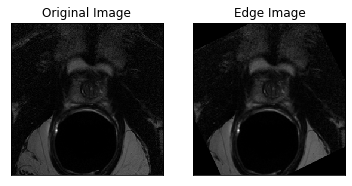

<class 'numpy.uint8'>


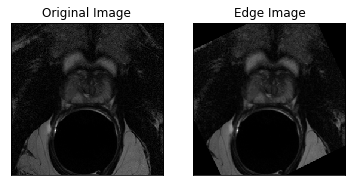

<class 'numpy.uint8'>


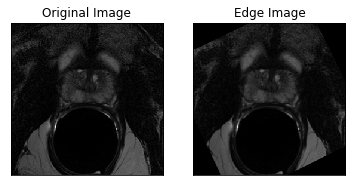

<class 'numpy.uint8'>


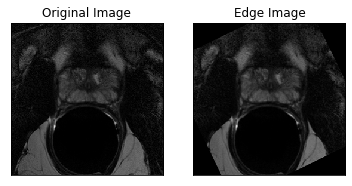

<class 'numpy.uint8'>


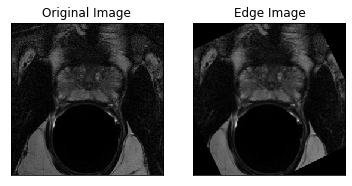

<class 'numpy.uint8'>


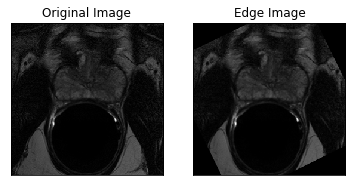

<class 'numpy.uint8'>


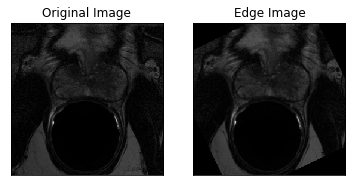

<class 'numpy.uint8'>


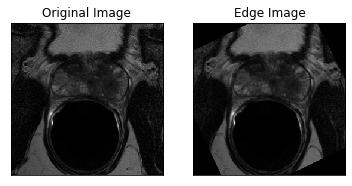

<class 'numpy.uint8'>


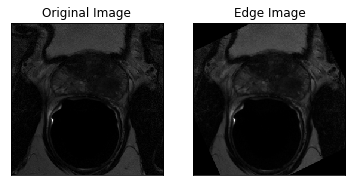

<class 'numpy.uint8'>


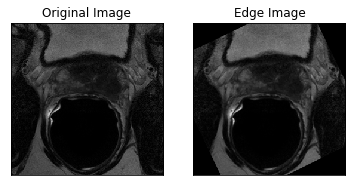

<class 'numpy.uint8'>


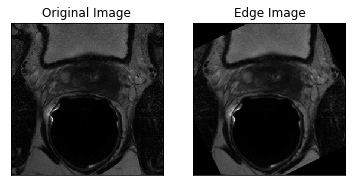

<class 'numpy.uint8'>


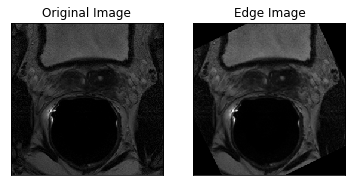

<class 'numpy.uint8'>


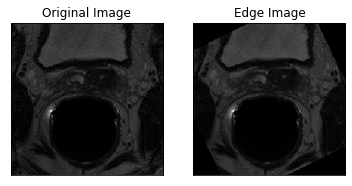

<Figure size 432x288 with 0 Axes>

In [124]:
test_images_path='project3_data/data/test_images'
rotated_images_path='project3_data/data/test_images_randomly_rotated'
#list of np arrays with size[256,256]
test_images=[]
#list of np arrays with size[256,256]
rotated_images=[]
for file in os.listdir(test_images_path):
    images=np.load(test_images_path+'/'+file)
    rotated=np.load(rotated_images_path+'/'+file)
    overall_depth=images.shape[0]
    for curr_depth in range(overall_depth):
        test_images.append(np.expand_dims(images[curr_depth], axis=2))
        corrected, inverse=alignImages(rotated[curr_depth],images[curr_depth])
        rotated_images.append(np.expand_dims(corrected, axis=2))
        plt.subplot(121),plt.imshow(images[curr_depth],cmap = 'gray')
        plt.title('Original Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(122),plt.imshow(corrected,cmap = 'gray')
        plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
        plt.show()
        plt.clf()
test_images=np.array(test_images)
rotated_images=np.array(rotated_images)